## **Exploratory Data Analysis of Airbnb Listings in Berlin**
Title: Exploratory Data Analysis of Airbnb Listings in Berlin

Author: Nitish Kumar Pandey

#### **1. Introduction of the Business Context**

##### **Client Overview**
The client is a global short-term rental website i.e Airbnb and wants to use exploratory data analysis (EDA) to gain a deeper understanding of the Berlin rental real estate market.  Their objectives are to set optimal prices, enhance customer satisfaction, and assist hosts with decision-making.

##### **Business Problem**
In a large market like Berlin, one needs to know pricing trends, host behavior, and availability patterns.  Airbnb aims to present wiser listing recommendations, assist hosts in establishing competitive prices, and enhance guest satisfaction amid rising competition.  Listing EDA can help identify latent trends and suggest data-driven operational improvements.

#### **2. Business Benefits**
* **Regarding the Business:**

    Dynamic pricing should be optimized based on room types and neighborhoods.    

    Identify areas that are well-performing and concentrate on growing or marketing them.    

    Examine poorly performing listings to enhance listing quality.    

    Identify business hosts who have listed more than one property and provide appropriate policy adjustments.    

    Make use of knowledge regarding user behavior in order to enhance the platform UX as well as search filters.

* **For Clients:**

    Price transparency between communities.

    More accurate recommendations using data trends.

    Improved quality and confidence through the elimination of low availability listings.

    Tailored recommendations based on shared room types and spaces.

    Improved satisfaction through matching guest expectations and listings.

 ##### **3. Data Collection**
 The dataset is collected from https://insideairbnb.com/get-the-data/

 File used: listings.csv (Berlin) (Detailed version)

##### **4. Sample Data Overview**
The data includes information about Berlin short-term rentals listings.

It has:

    Host information: host ID, number of listings.

    Property information: room type, property type, and neighborhood.

    Location: neighborhood group, latitude, and longitude.

    Cost and Availability: cost, number of nights required, and availability_365.

    Review data: number of reviews, last reviewed on.

##### **5. Formulating as an Analytical Task**

Detection of trends and insights in the Airbnb Berlin dataset to inform business decisions is what this project aims to do.

The task is laid out as:

    Identify price fluctuations by room type and location.

    Identify hosts that exhibit commercial behavior.

    Identify areas where there is high or low supply.

    Analyze any possible outliers or irregularities.

    Encourage strategic decisions that will be enhancing the platform.

#### **6. Importing the Required Libraries**
Used folium to create interactive maps. Map listings using latitude/longitude

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import warnings
warnings.filterwarnings("ignore")

#### **7. Fetching and Viewing Data**

In [28]:
df = pd.read_csv(r"/content/listings.csv")

In [29]:
print(df.shape)
df.head()

(14187, 18)


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,3176,Fabulous Flat in great Location,3718,Britta,Pankow,Prenzlauer Berg Südwest,52.53471,13.41810,Entire home/apt,105.0,63,149,2025-03-02,0.76,1,250,1,NaN
1,9991,Geourgeous flat - outstanding views,33852,Philipp,Pankow,Prenzlauer Berg Südwest,52.53269,13.41805,Entire home/apt,135.0,6,7,2020-01-04,0.06,1,193,0,03/Z/RA/003410-18
2,14325,Studio Apartment in Prenzlauer Berg,55531,Chris + Oliver,Pankow,Prenzlauer Berg Nordwest,52.54813,13.40366,Entire home/apt,75.0,150,26,2023-11-30,0.14,4,262,0,NaN
3,16644,In the Heart of Berlin - Kreuzberg,64696,Rene,Friedrichshain-Kreuzberg,nördliche Luisenstadt,52.50312,13.43508,Entire home/apt,NaN,93,48,2017-12-14,0.26,2,0,0,NaN
4,17904,Beautiful Kreuzberg studio - 3 months minimum,68997,Matthias,Neukölln,Reuterstraße,52.49419,13.42166,Entire home/apt,28.0,92,298,2022-12-01,1.60,1,111,0,NaN


#### **8. Reviewing Dataset for Missing Values & Duplicates**

In [30]:
df.isnull().sum()

,0
id,0
name,0
host_id,0
host_name,13
neighbourhood_group,0
neighbourhood,0
latitude,0
longitude,0
room_type,0
price,5004


In [31]:
df.duplicated().sum()

np.int64(0)

#### **9. Data Cleaning & Feature Selection in Dataset**

##### **9.1 Removing Irrelevant or Redundant Columns**

Certain columns, such as name, description, neighbourhood_group_cleansed, and id, are either duplicated in other columns or do not provide useful information for analysis. These columns can therefore be eliminated.

In [32]:
df.drop(columns=['id', 'name', 'host_name', 'license', 'neighbourhood_group'], inplace=True)

##### **9.2  Converting price to Numeric**

In [33]:
if df['price'].dtype == 'object':
    df['price'] = df['price'].str.replace(r'[^\d\.]', '', regex=True)
    df['price'] = pd.to_numeric(df['price'], errors='coerce')

##### **9.3 Handling Missing Values**

In [34]:
df['last_review'] = pd.to_datetime(df['last_review'], errors='coerce')
df['reviews_per_month'].fillna(0, inplace=True)

For the reviews_per_month column, any missing value means the listing never got reviews, so I will replace NaN with 0

In [35]:
price_na_before = df['price'].isna().sum()

Counts how many price entries are missing before we start imputing. (isna().sum() gives the number of NaNs.)

In [36]:
df['price'] = df.groupby(['neighbourhood', 'room_type'])['price'].transform(
    lambda x: x.fillna(x.median())
)

Since neighborhood and room_type are the two factors that most influence price, I grouped listings by both.I want to figure out the median price for each group. Only the missing price values within each group will be replaced with the median for that group..transform(...) yields a Series aligned to the original DataFrame, so the length and index remain unchanged; only the NaNs within each group are filled.

In [37]:
df['price'] = df.groupby('neighbourhood')['price'].transform(
    lambda x: x.fillna(x.median())
)

Tried again at a coarser level—neighbourhood-only median—if any price is still missing after Stage 1 (for example, in a rare group where all rows had missing prices, resulting in a group median of NaN).

The same concept: filling in the remaining NaNs and calculated the median for each neighborhood.

In [38]:
pre_rows = len(df)
df = df[(df['price'] >= 10) & (df['price'] <= 10000)]
post_rows = len(df)
print(f"Rows before: {pre_rows} | after: {post_rows} | Removed: {pre_rows - post_rows}")

Rows before: 14187 | after: 14172 | Removed: 15


In [39]:
price_na_after = df['price'].isna().sum()
print(f"Missing prices before: {price_na_before} | after: {price_na_after}")

Missing prices before: 5004 | after: 0


Finally, Data has been filter out obviously unrealistic prices: kept only listings with 10 ≤ price ≤ 10,000.

pre_rows and post_rows shows how many rows were dropped by this filter.

##### **9.4 Removing Duplicate Rows**

In [40]:
dup = df.duplicated().sum()
df = df.drop_duplicates()
print(f"Duplicates removed: {dup}")

Duplicates removed: 18


##### **9.5 Feature Selection**

Selecting only the relevant columns for your EDA.

Price, availability, Room type, neighbourhood, Latitude, longitude, Number of reviews, minimum nights

In [41]:
selected_columns = ['neighbourhood', 'room_type', 'price', 'minimum_nights',
                    'availability_365', 'number_of_reviews', 'last_review','reviews_per_month',
                    'calculated_host_listings_count', 'latitude', 'longitude']

df = df[selected_columns]

In [42]:
print(df.columns.tolist())

['neighbourhood', 'room_type', 'price', 'minimum_nights', 'availability_365', 'number_of_reviews', 'last_review', 'reviews_per_month', 'calculated_host_listings_count', 'latitude', 'longitude']


#### **10. Exploratory Data Analysis (EDA)**

##### **Q1. Which neighbourhoods have the highest average Airbnb prices?**
Location is the strongest driver of Airbnb pricing. This helps hosts understand which areas are most profitable.

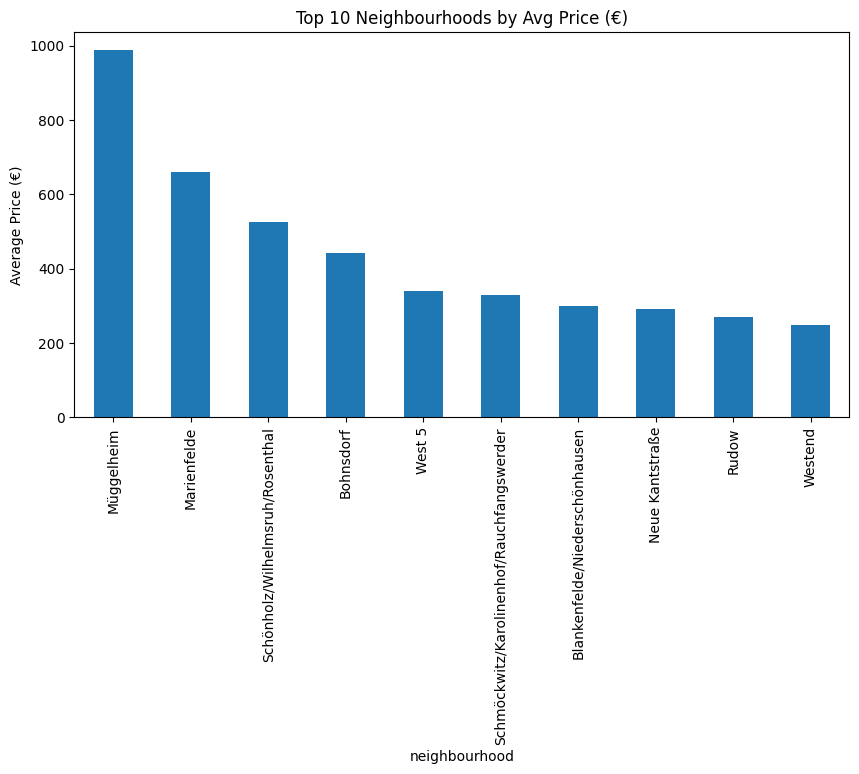

In [43]:
avg_price_neigh = (df.groupby('neighbourhood')['price']
                     .mean()
                     .sort_values(ascending=False)
                     .head(10))

ax = avg_price_neigh.plot(kind='bar', figsize=(10,5), title='Top 10 Neighbourhoods by Avg Price (€)')
ax.set_ylabel('Average Price (€)')
plt.show()

This bar chart shows the top 10 Berlin neighbourhoods by average Airbnb price. Central districts like Mitte and Charlottenburg command higher prices due to location and demand, while outer districts are less expensive. This insight helps hosts and Airbnb identify premium markets.

##### **Q2. How does room type impact supply and average price?**
Different room types (Entire home vs. Private room) target different customer segments. Hosts can use this insight to position their property competitively.


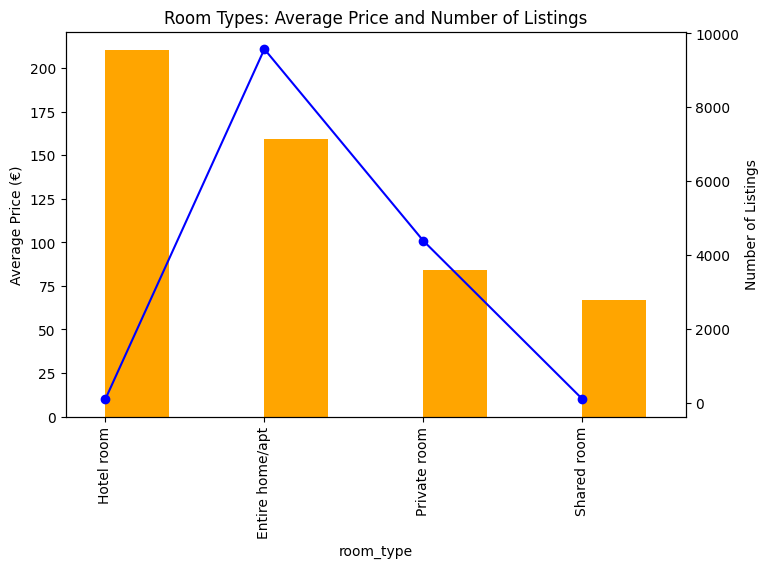

,num_listings,avg_price
room_type,,
Hotel room,98,210.367347
Entire home/apt,9573,159.045075
Private room,4383,83.891170
Shared room,100,66.720000


In [44]:
room_stats = (df.groupby('room_type')
                .agg(num_listings=('room_type','size'),
                     avg_price=('price','mean'))
                .sort_values('avg_price', ascending=False))

fig, ax1 = plt.subplots(figsize=(8,5))
room_stats['avg_price'].plot(kind='bar', ax=ax1, color='orange', position=0, width=0.4, label='Avg Price (€)')
ax1.set_ylabel('Average Price (€)')
ax1.set_title('Room Types: Average Price and Number of Listings')

ax2 = ax1.twinx()
room_stats['num_listings'].plot(kind='line', marker='o', color='blue', ax=ax2, label='Number of Listings')
ax2.set_ylabel('Number of Listings')
plt.show()
room_stats

This visualization compares room types by average price and supply. Entire homes/apartments have the highest supply and relatively high average prices, while shared rooms are cheapest and least common. Hotel rooms, though fewer, show premium pricing. This helps hosts position properties competitively.

##### **Q3. What is the relationship between number of reviews and price?**
Reviews are a proxy for demand. Understanding how reviews relate to price helps assess whether guest engagement drives premium pricing.

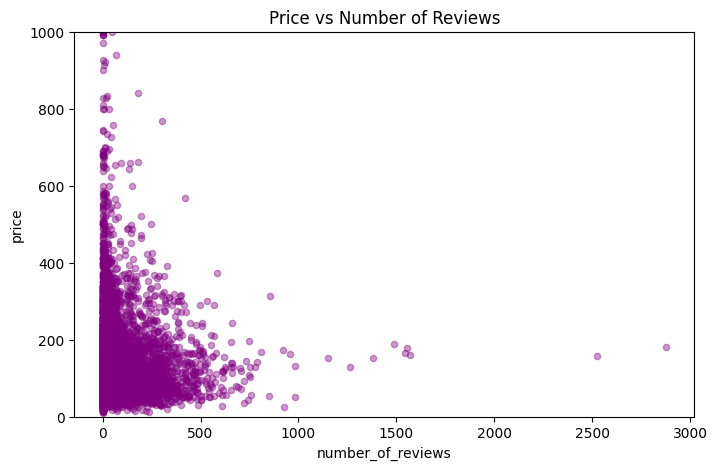

In [45]:
ax = df.plot.scatter(x='number_of_reviews', y='price',
                     alpha=0.4, figsize=(8,5),
                     title="Price vs Number of Reviews",
                     color='purple')
ax.set_ylim(0,1000)  # cap for clarity
plt.show()

The scatter plot shows that most listings have moderate prices and varying numbers of reviews. Very expensive listings (over €500/night) tend to have few reviews, while moderately priced listings attract more guest engagement. This suggests demand concentrates around affordable and mid-range options.

##### **Q4. What is the seasonal trend of activity?**

Seasonality affects demand and pricing. Identifying peak months helps hosts adjust availability and rates.

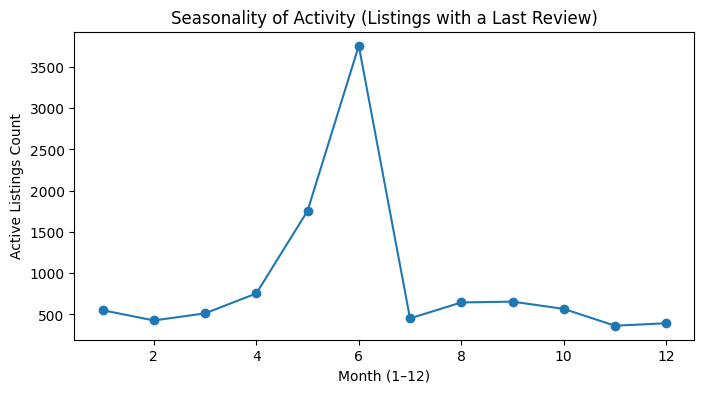

In [46]:
df['review_month'] = df['last_review'].dt.month
monthly_activity = df.groupby('review_month').size()

ax = monthly_activity.plot(kind='line', marker='o', figsize=(8,4))
ax.set_title("Seasonality of Activity (Listings with a Last Review)")
ax.set_xlabel('Month (1–12)'); ax.set_ylabel('Active Listings Count')
plt.show()

The line chart highlights strong seasonality in Airbnb activity. Reviews peak during the summer months (June–August), reflecting Berlin’s tourist season, and drop in winter. This helps Airbnb and hosts adjust prices and availability based on demand cycles.

##### **Q5. Which features correlate most with price?**

Correlation analysis helps identify which factors (minimum nights, availability, reviews) have the strongest influence on pricing.

In [47]:
df['last_review'] = pd.to_datetime(df['last_review'], errors='coerce')

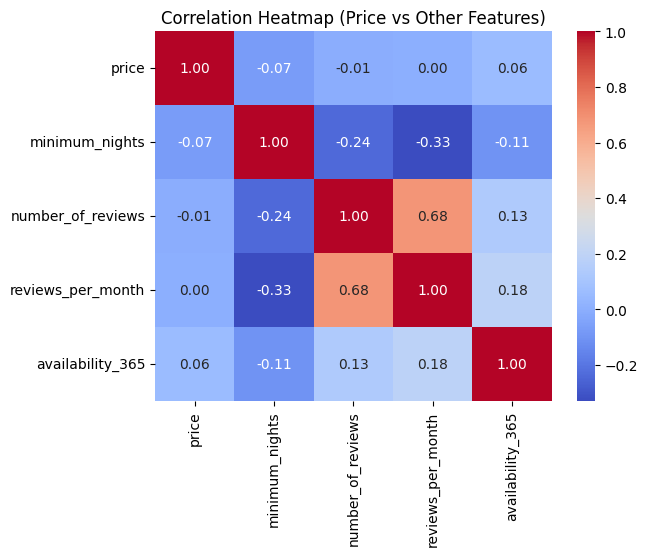

In [48]:
num_cols = ['price','minimum_nights','number_of_reviews',
            'reviews_per_month','availability_365']
corr = df[num_cols].corr()

sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap (Price vs Other Features)")
plt.show()

The heatmap shows the correlation between numeric features. Price has weak correlation with most numeric variables, suggesting categorical/location factors (room type, neighbourhood) are stronger price drivers. This indicates that business insights require analyzing both numeric and categorical data together.

##### **Q6. What do pairwise relationships between numeric features reveal?**

While a heatmap summarizes correlations with numbers, a pairplot provides a **visual understanding** of how variables interact. It helps identify skewed distributions, clusters of listings, or extreme outliers that may not be obvious from simple statistics.

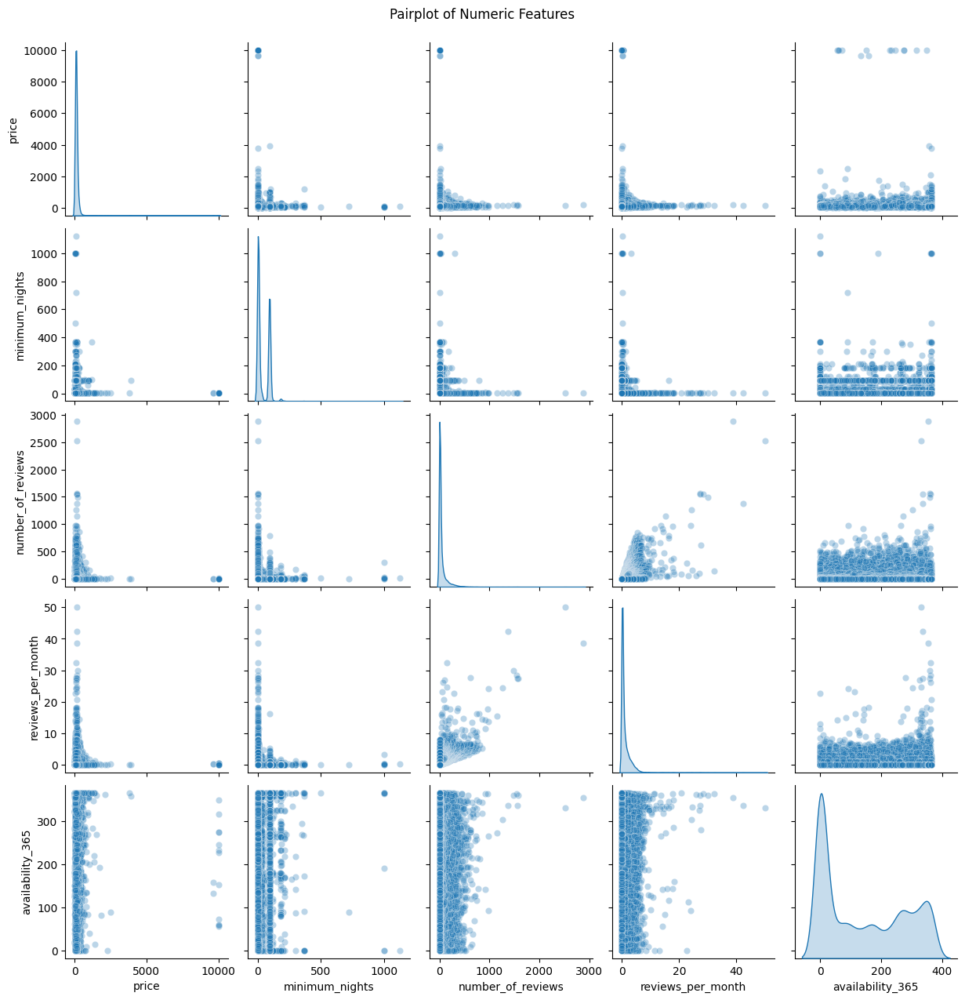

In [49]:
num_cols = ['price','minimum_nights','number_of_reviews',
            'reviews_per_month','availability_365']

sns.pairplot(df[num_cols], diag_kind='kde', plot_kws={'alpha':0.3})
plt.suptitle("Pairplot of Numeric Features", y=1.02)
plt.show()

**The pairplot shows that:**

Price is highly skewed, with a small number of extreme values even after outlier removal.

Minimum nights also shows heavy skew, with many listings offering very short stays and a few requiring unusually long stays.

Number of reviews and reviews per month display a positive association, confirming that listings with many reviews are also reviewed more frequently.

Overall, most numeric features do not show strong linear relationships, reinforcing that location and room type are more critical for explaining price differences.

##### **Q7. How are Airbnb listings distributed across Berlin geographically?**

Location is one of the strongest determinants of Airbnb pricing and demand. A geospatial map helps to understand where listings are concentrated within the city, revealing hotspots and potential oversupply areas.

In [50]:
map_berlin = folium.Map(location=[52.52, 13.405], zoom_start=11)
for idx, row in df.iterrows():
    folium.CircleMarker(location=[row["latitude"], row["longitude"]],
                        radius=1,
                        color="blue",
                        fill=True).add_to(map_berlin)
map_berlin

This map plots each Airbnb listing in Berlin using its latitude and longitude.

Concentration: Most listings cluster around the central districts (Mitte, Kreuzberg, Friedrichshain, Charlottenburg), reflecting high tourist demand.

Spread: Peripheral areas show fewer listings, which indicates less tourist activity and potentially untapped markets.

Business insight: Hosts in central clusters face stronger competition but benefit from higher nightly rates, while those in outer areas may attract budget-conscious travellers if transport links are good.

#### **11. Conclusion**

With Berlin Airbnb postings, much has been discovered on the influence of location, property type, and even seasonal demand upon prices and activities of guests. Visualization was utilized to explore six business questions after the prep and cleaning of the dataset.

The findings indicate that:
- **The most important one is location**: Charlottenburg and Mitte, both city districts, are the most costly.
- **Room type generates revenue**: Private or communal rooms are cheaper than entire houses and apartments, which are in excess supply.
- **Room type drives revenue**: Private or shared rooms are more affordable than entire homes and apartments, which are in oversupply.
- More reviews arrive for cheaply priced listings, though the luxury market still is a niche.
- **There is seasonality in tourism**: The high tourist season for tourists visiting Berlin is during summer.
- **Weak numerical drivers**: Characteristics such as availability and minimum nights are not price-related, so categorical drivers (room type, location) are more predictive.  
- Skewed distributions and outliers in minimum nights and price were confirmed through pairwise analysis, calling for diligent data preprocessing.

**Overall Suggestion:**

With greater availability during high demand periods, **hosts** must offer competitive prices with consideration of the location and the room. Setting neighborhood-level price points and promoting off-the-beaten-path locations could assist **Airbnb** in having a more balanced market.

In short-term rental, this project illustrates how **data-driven insights can be used to better inform smarter pricing, enhanced guest experiences, and better decision-making**. Even at the constraint of the size of the dataset, analysis uncovers how important EDA is in revealing actionable business intelligence.

#### **12. References**

Inside Airbnb (2025) *Berlin – Listings data*. Available at: https://insideairbnb.com/get-the-data